In [1]:
import numpy as np
import pandas as pd

In [2]:
from pathlib import Path

from tqdm.notebook import tqdm

import sys, os, random, time, glob
import numba, cv2, gc
import pickle

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as D

import torchvision
from torchvision import transforms as T
from segmentation_models_pytorch import Unet
from segmentation_models_pytorch import FPN
from segmentation_models_pytorch import Linknet
from segmentation_models_pytorch import PAN

import rasterio
from rasterio.windows import Window

import albumentations as A

In [3]:
from config.global_vars import *

### Configuration

In [4]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

In [5]:
DATA_PATH = Path('/home/jupyter/data_2/')
assert DATA_PATH.exists()

# path to our training notebook.
PATH_FOLD_MODELS = Path('models')
assert PATH_FOLD_MODELS.exists()

### Functions

In [6]:
@numba.njit()
def rle_numba(pixels):
    size = len(pixels)
    points = []
    if pixels[0] == 1: points.append(1)
    for i in range(1, size):
        if pixels[i] != pixels[i-1]:
            if len(points) % 2 == 0:
                points.append(i+1)
            else:
                points.append(i+1 - points[-1])
    if pixels[-1] == 1: points.append(size-points[-1]+1)    
    return points

def rle_numba_encode(image):
    pixels = image.flatten(order = 'F')
    points = rle_numba(pixels)
    return ' '.join(str(x) for x in points)

def make_grid(shape, window=256, min_overlap=32):
    """
        Return Array of size (N,4), where N - number of tiles,
        2nd axis represente slices: x1,x2,y1,y2 
    """
    x, y = shape
    nx = x // (window - min_overlap) + 1
    x1 = np.linspace(0, x, num=nx, endpoint=False, dtype=np.int64)
    x1[-1] = x - window
    x2 = (x1 + window).clip(0, x)
    ny = y // (window - min_overlap) + 1
    y1 = np.linspace(0, y, num=ny, endpoint=False, dtype=np.int64)
    y1[-1] = y - window
    y2 = (y1 + window).clip(0, y)
    slices = np.zeros((nx,ny, 4), dtype=np.int64)
    
    for i in range(nx):
        for j in range(ny):
            slices[i,j] = x1[i], x2[i], y1[j], y2[j]    
    return slices.reshape(nx*ny,4)


def rle_decode(mask_rle, shape=(256, 256)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    splits = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (splits[0:][::2], splits[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0] * shape[1], dtype='uint8')
    for lo, hi in zip(starts, ends):
        img[lo: hi] = 1
    return img.reshape(shape, order='F') # Fortran order reshaping

### Model

In [7]:
ARC = 'fpn'

class HuBMAPModel(nn.Module):
    def __init__(self):
        super(HuBMAPModel, self).__init__()
        args = {
            'encoder_name': ENCODER_NAME, 
            'encoder_weights': ENCODER_WEIGHTS,
            'classes': 2,
            'activation': None,
            'aux_params': None
        }
        if ARCH == 'unet':
            self.model = Unet(**args)
        elif ARCH == 'fpn':
            self.model = FPN(**args)
        elif ARCH == 'manet':
            self.model = MAnet(**args)
        elif ARCH == 'linknet':
            self.model = Linknet(**args)
        elif ARCH == 'pan':
            self.model = PAN(**args)
        
    def forward(self, images):
        return self.model(images)

def get_model(encoder_name='efficientnet-b7', is_fpn=False, is_linknet=False, is_pan=False):
    if(is_fpn):
        print('Loading FPN')
        model = FPN(encoder_name=encoder_name, 
                 encoder_weights='imagenet', 
                 in_channels=3, 
                 classes=2)
    elif(is_linknet):
        print('Loading Linknet')
        model = Linknet(encoder_name=encoder_name, 
                 encoder_weights='imagenet', 
                 in_channels=3, 
                 classes=2)
    elif(is_pan):
        print('Loading PAN')
        model = PAN(encoder_name=encoder_name, 
                 encoder_weights='imagenet', 
                 in_channels=3, 
                 classes=2)
    else:
        print('Loading Unet')
        model = Unet(encoder_name=encoder_name, 
                 encoder_weights='imagenet', 
                 in_channels=3, 
                 classes=2)
    model.to(DEVICE)
    return model

In [8]:
def load_model(model_path, model_func):
    print(f'Loading {model_path}')
    model_path = str(model_path)
    stats_dict = torch.load(model_path)
    print(f'Loaded stats dict for {model_path}')
    model = model_func(is_fpn=model_path.find('fpn') > -1, is_linknet=model_path.find('linknet') > -1, is_pan=model_path.find('pan') > -1)
    model.load_state_dict(stats_dict)
    model.eval()
    return model

In [9]:
fold_models_path = [PATH_FOLD_MODELS/'hubmap_pdf_sample_efficientnet-b7_b12.pth', 
                    PATH_FOLD_MODELS/'hubmap_pdf_sample_efficientnet-b7_b6.pth', 
                    PATH_FOLD_MODELS/'hubmap_pdf_sample_dice_loss_linknet_efficientnet-b7_b12.pth',
                    PATH_FOLD_MODELS/'hubmap_pdf_sample_dice_loss_fpn_efficientnet-b7_b6.pth']

In [10]:
for p in fold_models_path:
    assert p.exists()

In [11]:
fold_models = [load_model(m, get_model) for m in fold_models_path]

Loading models/hubmap_pdf_sample_efficientnet-b7_b12.pth
Loaded stats dict for models/hubmap_pdf_sample_efficientnet-b7_b12.pth
Loading Unet
Loading models/hubmap_pdf_sample_efficientnet-b7_b6.pth
Loaded stats dict for models/hubmap_pdf_sample_efficientnet-b7_b6.pth
Loading Unet
Loading models/hubmap_pdf_sample_dice_loss_linknet_efficientnet-b7_b12.pth
Loaded stats dict for models/hubmap_pdf_sample_dice_loss_linknet_efficientnet-b7_b12.pth
Loading Linknet
Loading models/hubmap_pdf_sample_dice_loss_fpn_efficientnet-b7_b6.pth
Loaded stats dict for models/hubmap_pdf_sample_dice_loss_fpn_efficientnet-b7_b6.pth
Loading FPN


### Prediction

In [12]:
def get_preprocessing(mean=[0.61561477, 0.5179343 , 0.64067212], std=[0.2915353 , 0.31549066, 0.28647661]):
    _transform = [
        A.Normalize(mean=mean, std=std, 
                       max_pixel_value=255.0, always_apply=True, p=1.0)
    ]
    return A.Compose(_transform)

In [20]:
overlaps = [1]
WINDOW = 1536 # tile size
NEW_SIZE = 768 # size after re-size which are fed to the model

In [21]:
# overlaps = [1]
# WINDOW = 1792 # tile size
# NEW_SIZE = 896 # size after re-size which are fed to the model

In [22]:
identity = rasterio.Affine(1, 0, 0, 0, 1, 0)

In [23]:
import matplotlib.pyplot as plt

def plot_img_mask(score, raw_image, index):
    if (score > 0).astype(np.uint8).sum() > 0:
        print('Plotting')
        fig, ax = plt.subplots(ncols=2, figsize=(15,15))
        resize_w = 250
        resize = 250
        ax[0].imshow(score)
        ax[0].set_title(f'Mask {index}')
        ax[0].set_axis_off()
        ax[1].imshow(raw_image)
        ax[1].set_title(f'Image {index}')
        ax[1].set_axis_off()

In [24]:
p = Path(DATA_PATH)
PLOT_TILES = 200

def create_submission(process_score_func, preprocess_input, fold_models,
                      window=WINDOW, new_size=NEW_SIZE, overlaps=overlaps, threshold=0.49):
    submissions = []
    with torch.no_grad():
        for overlap in overlaps:
            count = 0
            subm = {}
            for i, filename in tqdm(enumerate(p.glob('test/*.tiff')), total = len(list(p.glob('test/*.tiff')))):
                print(filename.stem)
                if('aa05346ff' != filename.stem): continue

                dataset = rasterio.open(filename.as_posix(), transform = identity)
                slices = make_grid(dataset.shape, window=window, min_overlap=overlap)

                preds = np.zeros(dataset.shape, dtype=np.uint8)
                if dataset.count != 3:
                    print(f'Image file ({filename}) with subdatasets as channels')
                    layers = [rasterio.open(subd) for subd in dataset.subdatasets]

                for slice_index, (x1,x2,y1,y2) in enumerate(tqdm(slices, total = len(slices))):
                    if dataset.count == 3:
                        image = dataset.read([1,2,3],
                                    window=Window.from_slices((x1,x2),(y1,y2)))
                        image = np.moveaxis(image, 0, -1)
                    else:
                        image = np.zeros((window, window, 3), dtype=np.uint8)
                        for fl in range(3):
                            image[:,:,fl] = layers[fl].read(window=Window.from_slices((x1,x2),(y1,y2)))

                    raw_image = image
                    image = preprocess_input(image = image)['image']
                    needs_resize = image.shape[0] != new_size
                    if needs_resize:
                        image = cv2.resize(image, (new_size, new_size))
                    image = np.moveaxis(image, -1, 0)
                    image = torch.from_numpy(image)
                    pred = np.zeros([len(fold_models), window, window])
                    count += 1
                    for j, fold_model in enumerate(fold_models):
                        score = fold_model(image.float().to(DEVICE)[None])
                        score = process_score_func(score)
                        if needs_resize:
                            pred[j] = cv2.resize(score, (window, window))
                        else:
                            pred[j] = score
                        
                    pred = np.mean(pred, axis=0)
                    preds[x1:x2,y1:y2] = (pred > threshold).astype(np.uint8)
                    if count < PLOT_TILES:
                        plot_img_mask((pred > threshold).astype(np.uint8), raw_image, slice_index)
                    else: return
                return
            
                subm[i] = {'id':filename.stem, 'predicted': rle_numba_encode(preds), 'shape': preds.shape}
            submissions.append(subm)
    return submissions

In [25]:
def process_score_func(score):
    score = score.squeeze()
    score = torch.argmax(score, 0)
    score = score.cpu().numpy().astype(np.float32)
    return score

  0%|          | 0/5 [00:00<?, ?it/s]

2ec3f1bb9
3589adb90
57512b7f1
aa05346ff
Image file (/home/jupyter/data_2/test/aa05346ff.tiff) with subdatasets as channels


  0%|          | 0/651 [00:00<?, ?it/s]

Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting


/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
Plotting
CPU times: user 1min 27s, sys: 13.4 s, total: 1min 40s
Wall time: 1min 25s


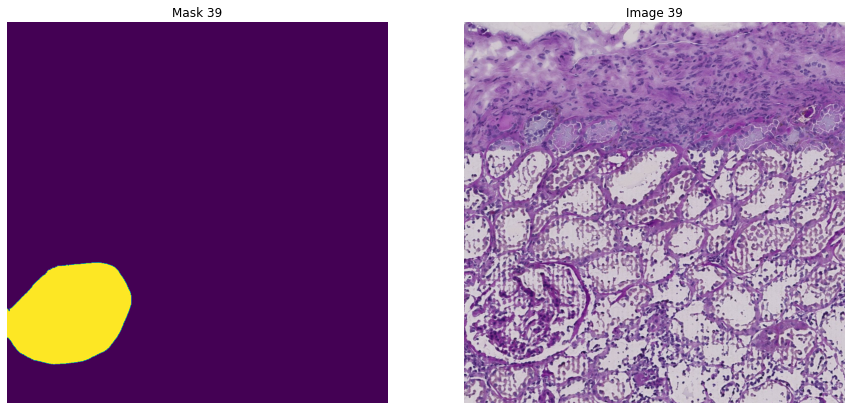

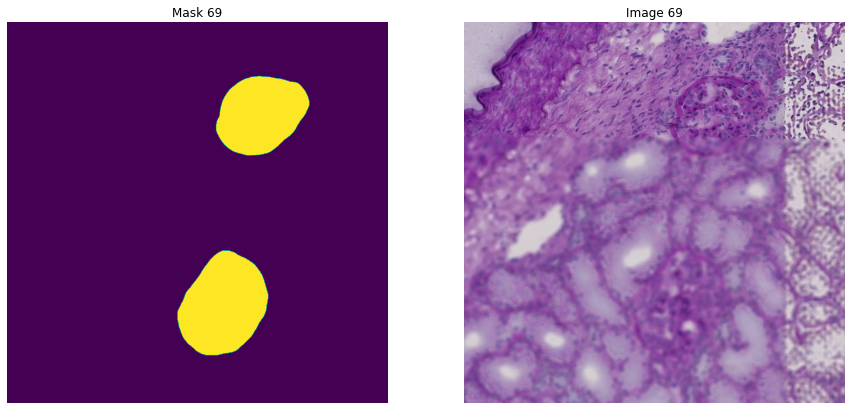

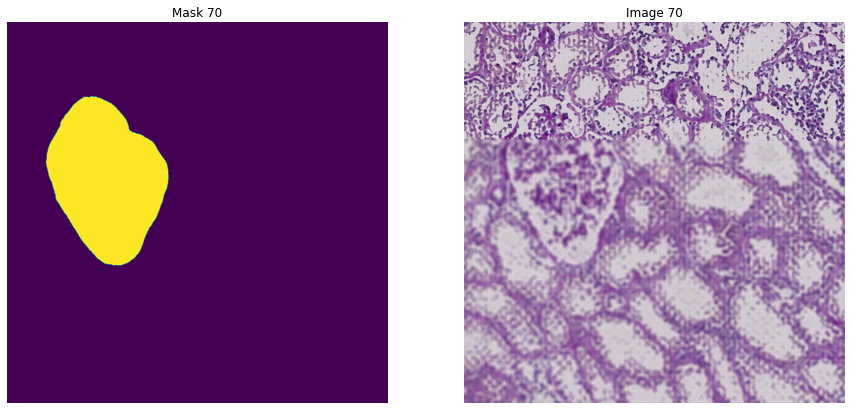

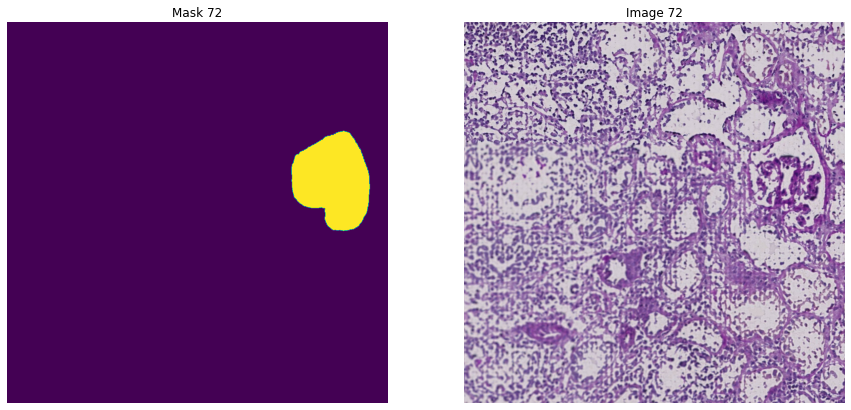

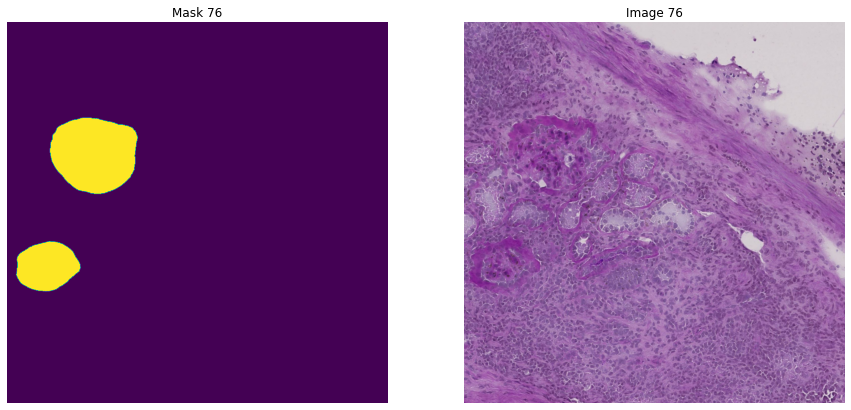

...

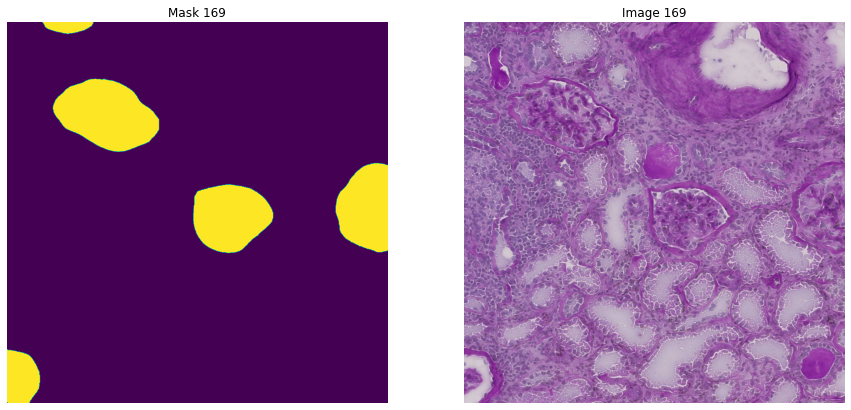

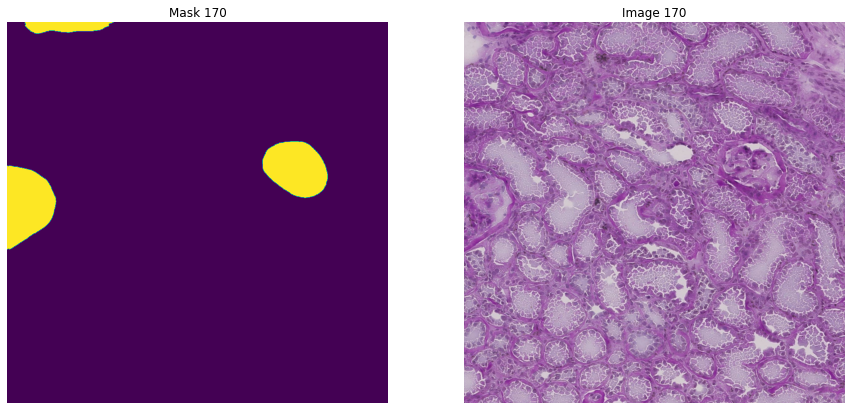

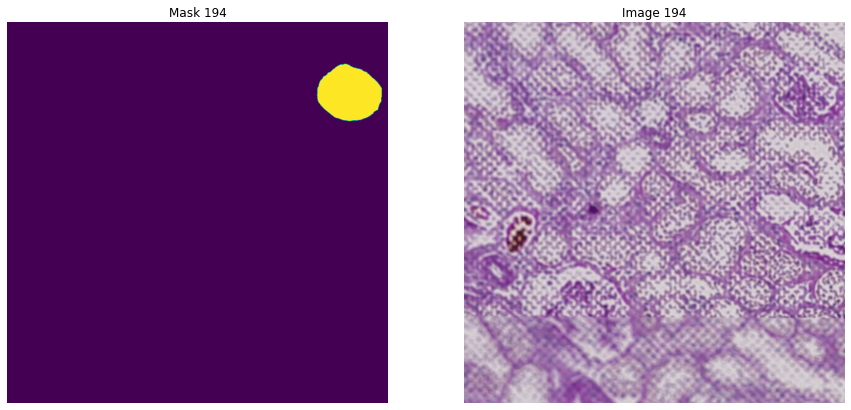

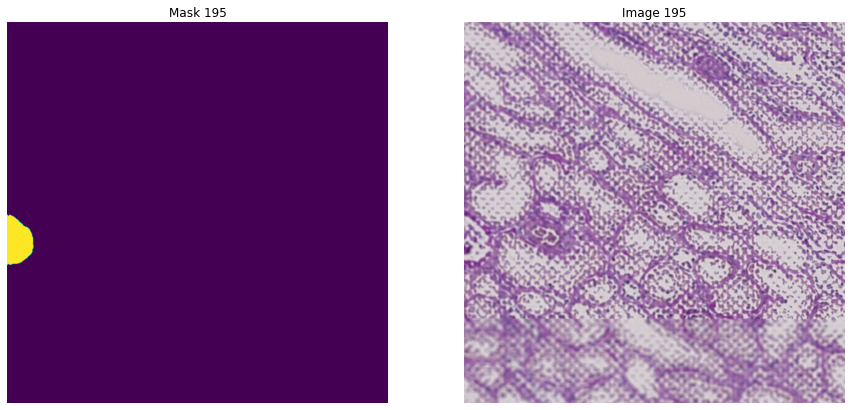

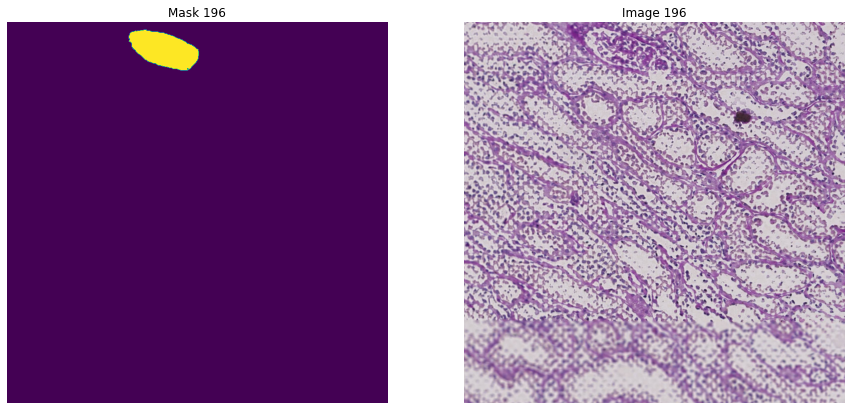

In [26]:
%%time

preprocess_input = get_preprocessing()

submissions = create_submission(process_score_func, preprocess_input, fold_models,
                                window=WINDOW, new_size=NEW_SIZE, overlaps=overlaps, threshold=0.49)